In [2]:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import sklearn as sk

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
df=pd.read_csv("/content/drive/My Drive/Colab Notebooks/CSI_model_ready_systolic.csv")

In [5]:
df.shape

(2137, 32)

In [6]:
df.describe()

,Unnamed: 0,person_age,person_sex,lifestyle_smoking,lifestyle_alcohol,health_BMI,household_income,health_bp_systolic,health_bp_diastolic,report_HBA1C,...,diet_vegetables,diet_fish,diet_chicken,diet_meat,diet_eggs,diet_milk,Parental_Diabetes,Parental_HEARTDISEASE,appearance,edu
count,2137.000000,2.137000e+03,2137.000000,2137.000000,2137.000000,2.137000e+03,2.137000e+03,2.137000e+03,2137.000000,1731.000000,...,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000,2137.000000
mean,1107.793168,1.595978e-16,0.580253,0.229761,0.203088,2.294218e-16,-2.659963e-17,3.125457e-15,84.570894,5.349295,...,0.962096,0.424293,0.107761,0.020122,0.261916,0.266194,0.064109,0.171736,1.331306,3.521292
std,633.393123,1.000000e+00,0.493633,0.420778,0.402392,1.000000e+00,1.000000e+00,1.000000e+00,12.098525,2.569032,...,0.156228,0.277023,0.126014,0.074736,0.259658,0.408437,0.245004,0.377239,0.738024,2.109511
min,0.000000,-2.235679e+00,0.000000,0.000000,0.000000,-2.470945e+00,-6.659930e-01,-3.902361e+00,43.000000,3.800000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,566.000000,-7.152655e-01,0.000000,0.000000,0.000000,-6.922623e-01,-4.974827e-01,-6.194250e-01,77.000000,4.600000,...,1.000000,0.285714,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000
50%,1108.000000,4.494125e-02,1.000000,0.000000,0.000000,-5.963287e-02,-3.626745e-01,1.278224e-02,84.000000,5.100000,...,1.000000,0.428571,0.142857,0.000000,0.285714,0.000000,0.000000,0.000000,1.000000,3.000000
75%,1653.000000,8.051480e-01,1.000000,0.000000,0.000000,6.157805e-01,1.091541e-01,6.711311e-01,92.000000,5.600000,...,1.000000,0.571429,0.142857,0.000000,0.428571,0.428571,0.000000,0.000000,2.000000,6.000000
max,2204.000000,1.818757e+00,1.000000,1.000000,1.000000,4.045389e+00,1.615133e+01,3.918733e+00,210.000000,102.540000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,7.000000


In [7]:
df.head()

,Unnamed: 0,person_age,person_sex,person_appearance,lifestyle_smoking,lifestyle_alcohol,health_BMI,household_income,person_education,relative_cad,...,diet_chicken,diet_meat,diet_eggs,diet_milk,parental_disease,Parental_Diabetes,Parental_HEARTDISEASE,appearance,education,edu
0,0,0.213876,0,THIN,0,0,-2.267474,-0.194164,HIGHER SECONDARY,NO,...,0.142857,0.000000,0.571429,1.0,NO,0,0,0,HIGHER SECONDARY,4
1,1,-0.377396,1,SLIM,0,1,-1.096655,-0.463781,PRIMARY SCHOOL,NO,...,0.142857,0.000000,0.285714,0.0,NO,0,0,1,PRIMARY SCHOOL,1
2,2,1.565355,1,SLIM,1,0,-1.181784,0.311366,SECONDARY,YES,...,0.142857,0.000000,0.142857,0.0,HEART DISEASE,0,1,1,SECONDARY,3
3,3,1.565355,0,SLIM,0,0,-1.924494,0.142856,SECONDARY,NO,...,0.142857,0.000000,0.142857,1.0,NO,0,0,1,SECONDARY,3
4,4,1.396420,1,HEALTHY,1,1,0.329434,0.311366,SECONDARY,YES,...,0.000000,0.142857,0.000000,1.0,NO,0,0,2,SECONDARY,3


In [8]:
df.isnull().sum()

Unnamed: 0                    0
person_age                    0
person_sex                    0
person_appearance             0
lifestyle_smoking             0
lifestyle_alcohol             0
health_BMI                    0
household_income              0
person_education              0
relative_cad                 66
relative_disease              0
relative_relation          1481
health_bp_systolic            0
health_bp_diastolic           0
report_HBA1C                406
household_water               0
household_oil                 0
household_oil_MUSTARD         0
household_oil_SUNFLOWER       0
household_oil_SOYBEAN         0
diet_vegetables               0
diet_fish                     0
diet_chicken                  0
diet_meat                     0
diet_eggs                     0
diet_milk                     0
parental_disease              0
Parental_Diabetes             0
Parental_HEARTDISEASE         0
appearance                    0
education                     0
edu     

In [21]:
from sklearn.preprocessing import PolynomialFeatures
new_df=df.drop(columns=['household_oil',"person_appearance","health_BMI","person_education","relative_disease",
"relative_relation","relative_cad","parental_disease","education","report_HBA1C"])

In [23]:
new_df.head()

,Unnamed: 0,person_age,person_sex,lifestyle_smoking,lifestyle_alcohol,household_income,health_bp_systolic,health_bp_diastolic,household_water,household_oil_MUSTARD,...,diet_vegetables,diet_fish,diet_chicken,diet_meat,diet_eggs,diet_milk,Parental_Diabetes,Parental_HEARTDISEASE,appearance,edu
0,0,0.213876,0,0,0,-0.194164,-1.379784,62,FILTERED,0.445476,...,1.0,0.857143,0.142857,0.000000,0.571429,1.0,0,0,0,4
1,1,-0.377396,1,0,1,-0.463781,1.267078,92,TUBEWELL,-2.243739,...,1.0,0.428571,0.142857,0.000000,0.285714,0.0,0,0,1,1
2,2,1.565355,1,1,0,0.311366,1.526980,85,FILTERED,-2.243739,...,1.0,0.714286,0.142857,0.000000,0.142857,0.0,0,1,1,3
3,3,1.565355,0,0,0,0.142856,1.741517,106,TUBEWELL,0.445476,...,1.0,0.714286,0.142857,0.000000,0.142857,1.0,0,0,1,3
4,4,1.396420,1,1,1,0.311366,1.846103,100,FILTERED,-2.243739,...,1.0,1.000000,0.000000,0.142857,0.000000,1.0,0,0,2,3


In [24]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression

In [25]:
from sklearn.model_selection import train_test_split
X= new_df.drop(columns="health_bp_systolic")
y=new_df["health_bp_systolic"]
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=55)

In [13]:
%pip install category-encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 2.3 MB/s eta 0:00:00


In [26]:
#import the libraries to target encode "Household_water"
import category_encoders as ce

#Create target encoding object
encoder=ce.TargetEncoder(cols=['household_water'])

#Fit the encoder on the training data(here the encoder learns the average value for each category)
encoder.fit(x_train, y_train)

#Transform the data(Replaces the original values with the average values)
x_train_encoded=encoder.transform(x_train)


x_train_encoded


,Unnamed: 0,person_age,person_sex,lifestyle_smoking,lifestyle_alcohol,household_income,health_bp_diastolic,household_water,household_oil_MUSTARD,household_oil_SUNFLOWER,...,diet_vegetables,diet_fish,diet_chicken,diet_meat,diet_eggs,diet_milk,Parental_Diabetes,Parental_HEARTDISEASE,appearance,edu
1238,1284,0.805148,1,0,1,-0.194164,84,0.024313,0.445476,1.630338,...,1.000000,0.857143,0.142857,0.0,0.285714,1.000000,0,0,1,4
1956,2020,-1.306537,1,1,1,-0.295270,84,-0.033728,0.445476,-0.613083,...,1.000000,0.285714,0.142857,0.0,0.285714,0.000000,0,0,2,2
2087,2152,0.889615,1,0,0,1.659448,82,0.024313,0.445476,1.630338,...,1.000000,0.571429,0.142857,0.0,0.142857,0.000000,0,0,1,7
259,273,1.565355,1,1,0,-0.598589,83,0.024313,0.445476,-0.613083,...,1.000000,0.857143,0.142857,0.0,0.285714,0.000000,0,0,2,3
1143,1185,0.382811,1,0,0,-0.362675,97,-0.033728,0.445476,-0.613083,...,1.000000,0.428571,0.142857,0.0,0.285714,0.000000,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1981,2045,-0.123994,1,0,1,0.648387,78,0.024313,0.445476,-0.613083,...,1.000000,0.428571,0.142857,0.0,0.428571,0.571429,1,0,2,6
968,1007,1.480887,0,0,0,-0.396377,100,0.049146,-2.243739,-0.613083,...,0.857143,0.142857,0.000000,0.0,0.000000,0.000000,0,0,1,2
295,311,1.480887,0,0,0,-0.564887,98,0.049146,0.445476,-0.613083,...,1.000000,0.571429,0.142857,0.0,0.428571,0.000000,0,0,2,0
666,702,-0.546331,0,0,0,-0.564887,86,-0.033728,0.445476,-0.613083,...,1.000000,0.142857,0.000000,0.0,0.142857,0.000000,0,0,1,2


In [27]:
x_train_encoded.household_water = (x_train_encoded.household_water - x_train_encoded.household_water.mean())/(x_train_encoded.household_water.std())

In [28]:
x_train_encoded.isnull().sum()

Unnamed: 0                 0
person_age                 0
person_sex                 0
lifestyle_smoking          0
lifestyle_alcohol          0
household_income           0
health_bp_diastolic        0
household_water            0
household_oil_MUSTARD      0
household_oil_SUNFLOWER    0
household_oil_SOYBEAN      0
diet_vegetables            0
diet_fish                  0
diet_chicken               0
diet_meat                  0
diet_eggs                  0
diet_milk                  0
Parental_Diabetes          0
Parental_HEARTDISEASE      0
appearance                 0
edu                        0
dtype: int64

In [29]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x_train_encoded,i) for i in range (x_train_encoded.shape[1])]
vif["features"]=x_train_encoded.columns
vif

,vif,features
0,4.401632,Unnamed: 0
1,1.190041,person_age
2,3.646288,person_sex
3,1.825408,lifestyle_smoking
4,1.695059,lifestyle_alcohol
5,1.271724,household_income
6,29.147778,health_bp_diastolic
7,1.103032,household_water
8,1.210652,household_oil_MUSTARD
9,1.423689,household_oil_SUNFLOWER


In [17]:
test = new_df.drop(columns=['household_water'])
test

,Unnamed: 0,person_age,person_sex,lifestyle_smoking,lifestyle_alcohol,household_income,health_bp_systolic,health_bp_diastolic,report_HBA1C,household_oil_MUSTARD,...,diet_vegetables,diet_fish,diet_chicken,diet_meat,diet_eggs,diet_milk,Parental_Diabetes,Parental_HEARTDISEASE,appearance,edu
0,0,0.213876,0,0,0,-0.194164,-1.379784,62,5.3,0.445476,...,1.0,0.857143,0.142857,0.000000,0.571429,1.000000,0,0,0,4
1,1,-0.377396,1,0,1,-0.463781,1.267078,92,4.3,-2.243739,...,1.0,0.428571,0.142857,0.000000,0.285714,0.000000,0,0,1,1
2,2,1.565355,1,1,0,0.311366,1.526980,85,5.8,-2.243739,...,1.0,0.714286,0.142857,0.000000,0.142857,0.000000,0,1,1,3
3,3,1.565355,0,0,0,0.142856,1.741517,106,5.6,0.445476,...,1.0,0.714286,0.142857,0.000000,0.142857,1.000000,0,0,1,3
4,4,1.396420,1,1,1,0.311366,1.846103,100,8.1,-2.243739,...,1.0,1.000000,0.000000,0.142857,0.000000,1.000000,0,0,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2132,2199,0.805148,1,0,0,0.311366,0.328599,94,6.6,0.445476,...,1.0,0.714286,0.142857,0.000000,0.000000,0.000000,0,0,3,4
2133,2200,0.467278,1,1,1,-0.362675,1.635163,105,6.3,-2.243739,...,1.0,0.428571,0.000000,0.000000,0.000000,0.000000,0,0,2,2
2134,2201,-1.897809,1,1,1,-0.531185,-1.496315,68,4.0,0.445476,...,1.0,0.285714,0.142857,0.000000,0.428571,0.285714,1,0,1,2
2135,2202,-0.546331,1,1,1,1.659448,0.284442,98,5.4,0.445476,...,1.0,0.714286,0.142857,0.000000,0.142857,0.000000,0,1,2,2


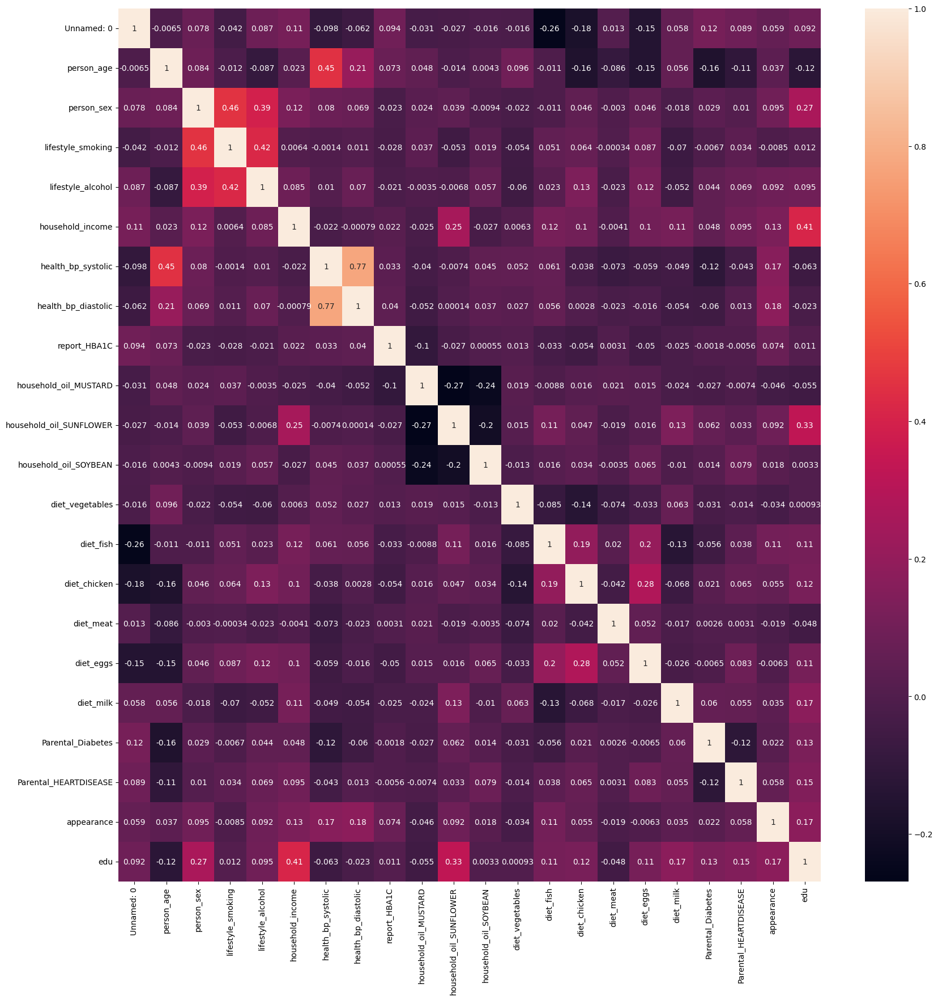

In [18]:

corr_hmap=test.corr()

plt.figure(figsize=(20,20))
sns.heatmap(corr_hmap,annot=True)
plt.show()

In [30]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(2)
x_train_encoded.drop(columns=['Unnamed: 0'],inplace=True)
trans = poly.fit_transform(x_train_encoded)

In [31]:
columns = poly.get_feature_names_out(input_features=None)
columns

array(['1', 'person_age', 'person_sex', 'lifestyle_smoking',
       'lifestyle_alcohol', 'household_income', 'health_bp_diastolic',
       'household_water', 'household_oil_MUSTARD',
       'household_oil_SUNFLOWER', 'household_oil_SOYBEAN',
       'diet_vegetables', 'diet_fish', 'diet_chicken', 'diet_meat',
       'diet_eggs', 'diet_milk', 'Parental_Diabetes',
       'Parental_HEARTDISEASE', 'appearance', 'edu', 'person_age^2',
       'person_age person_sex', 'person_age lifestyle_smoking',
       'person_age lifestyle_alcohol', 'person_age household_income',
       'person_age health_bp_diastolic', 'person_age household_water',
       'person_age household_oil_MUSTARD',
       'person_age household_oil_SUNFLOWER',
       'person_age household_oil_SOYBEAN', 'person_age diet_vegetables',
       'person_age diet_fish', 'person_age diet_chicken',
       'person_age diet_meat', 'person_age diet_eggs',
       'person_age diet_milk', 'person_age Parental_Diabetes',
       'person_age Parent

In [32]:
second_step_poly = pd.DataFrame(data=trans, index=x_train_encoded.index, columns= columns)
second_step_poly

,1,person_age,person_sex,lifestyle_smoking,lifestyle_alcohol,household_income,health_bp_diastolic,household_water,household_oil_MUSTARD,household_oil_SUNFLOWER,...,Parental_Diabetes^2,Parental_Diabetes Parental_HEARTDISEASE,Parental_Diabetes appearance,Parental_Diabetes edu,Parental_HEARTDISEASE^2,Parental_HEARTDISEASE appearance,Parental_HEARTDISEASE edu,appearance^2,appearance edu,edu^2
1238,1.0,0.805148,1.0,0.0,1.0,-0.194164,84.0,0.348941,0.445476,1.630338,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,16.0
1956,1.0,-1.306537,1.0,1.0,1.0,-0.295270,84.0,-1.583070,0.445476,-0.613083,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,4.0
2087,1.0,0.889615,1.0,0.0,0.0,1.659448,82.0,0.348941,0.445476,1.630338,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7.0,49.0
259,1.0,1.565355,1.0,1.0,0.0,-0.598589,83.0,0.348941,0.445476,-0.613083,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,6.0,9.0
1143,1.0,0.382811,1.0,0.0,0.0,-0.362675,97.0,-1.583070,0.445476,-0.613083,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1981,1.0,-0.123994,1.0,0.0,1.0,0.648387,78.0,0.348941,0.445476,-0.613083,...,1.0,0.0,2.0,6.0,0.0,0.0,0.0,4.0,12.0,36.0
968,1.0,1.480887,0.0,0.0,0.0,-0.396377,100.0,1.175592,-2.243739,-0.613083,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0
295,1.0,1.480887,0.0,0.0,0.0,-0.564887,98.0,1.175592,0.445476,-0.613083,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0
666,1.0,-0.546331,0.0,0.0,0.0,-0.564887,86.0,-1.583070,0.445476,-0.613083,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0


In [34]:
from sklearn.feature_selection import mutual_info_regression
mutual_info = mutual_info_regression(second_step_poly, y_train)
mutual_info

array([0.        , 0.13045935, 0.00064686, 0.        , 0.        ,
       0.00796905, 0.55824134, 0.        , 0.        , 0.        ,
       0.        , 0.01501988, 0.02025613, 0.00816328, 0.01328328,
       0.        , 0.01724914, 0.00679268, 0.        , 0.04007725,
       0.        , 0.07394831, 0.11011302, 0.02657721, 0.01150102,
       0.01041095, 0.14851397, 0.09526341, 0.11452724, 0.09898249,
       0.12433887, 0.13426507, 0.12268069, 0.05995814, 0.00763446,
       0.05581741, 0.04187211, 0.01439124, 0.02615379, 0.11195317,
       0.09092381, 0.01163394, 0.        , 0.00379987, 0.        ,
       0.28834594, 0.00837744, 0.        , 0.        , 0.        ,
       0.03696899, 0.04132797, 0.00204542, 0.01401317, 0.        ,
       0.        , 0.        , 0.        , 0.02863177, 0.01118223,
       0.01592547, 0.        , 0.        , 0.12575224, 0.00907581,
       0.        , 0.00370188, 0.        , 0.02492379, 0.        ,
       0.02776614, 0.03215624, 0.00833215, 0.0073588 , 0.02084

In [40]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = second_step_poly.columns
pd.set_option('display.max_rows', None)
mutual_info.sort_values(ascending=True)


1                                                0.000000
lifestyle_smoking household_oil_MUSTARD          0.000000
household_water edu                              0.000000
household_oil_MUSTARD household_oil_SUNFLOWER    0.000000
lifestyle_smoking household_income               0.000000
lifestyle_smoking lifestyle_alcohol              0.000000
household_oil_MUSTARD diet_eggs                  0.000000
household_oil_MUSTARD diet_milk                  0.000000
household_oil_MUSTARD Parental_HEARTDISEASE      0.000000
household_water Parental_HEARTDISEASE            0.000000
person_sex Parental_HEARTDISEASE                 0.000000
person_sex diet_milk                             0.000000
person_sex diet_eggs                             0.000000
household_oil_SUNFLOWER^2                        0.000000
household_oil_SUNFLOWER household_oil_SOYBEAN    0.000000
household_oil_SUNFLOWER diet_vegetables          0.000000
person_sex household_oil_SOYBEAN                 0.000000
person_sex hou

In [ ]:
second_step_poly.drop(columns=['household_oil_MUSTARD^2','household_oil_SUNFLOWER^2','household_oil_SOYBEAN^2'],inplace=True)

In [ ]:
vif=pd.DataFrame()
vif["vif"] = [variance_inflation_factor(second_step_poly,i) for i in range (second_step_poly.shape[1])]
vif["features"]=second_step_poly.columns
pd.options.display.max_rows = 1000
vif

,vif,features
0,916.990186,1
1,73.424403,person_age
2,inf,person_sex
3,inf,lifestyle_smoking
4,inf,lifestyle_alcohol
5,199.708779,household_income
6,102.778956,household_water
7,146.290172,household_oil_MUSTARD
8,167.077860,household_oil_SUNFLOWER
9,81.051377,household_oil_SOYBEAN


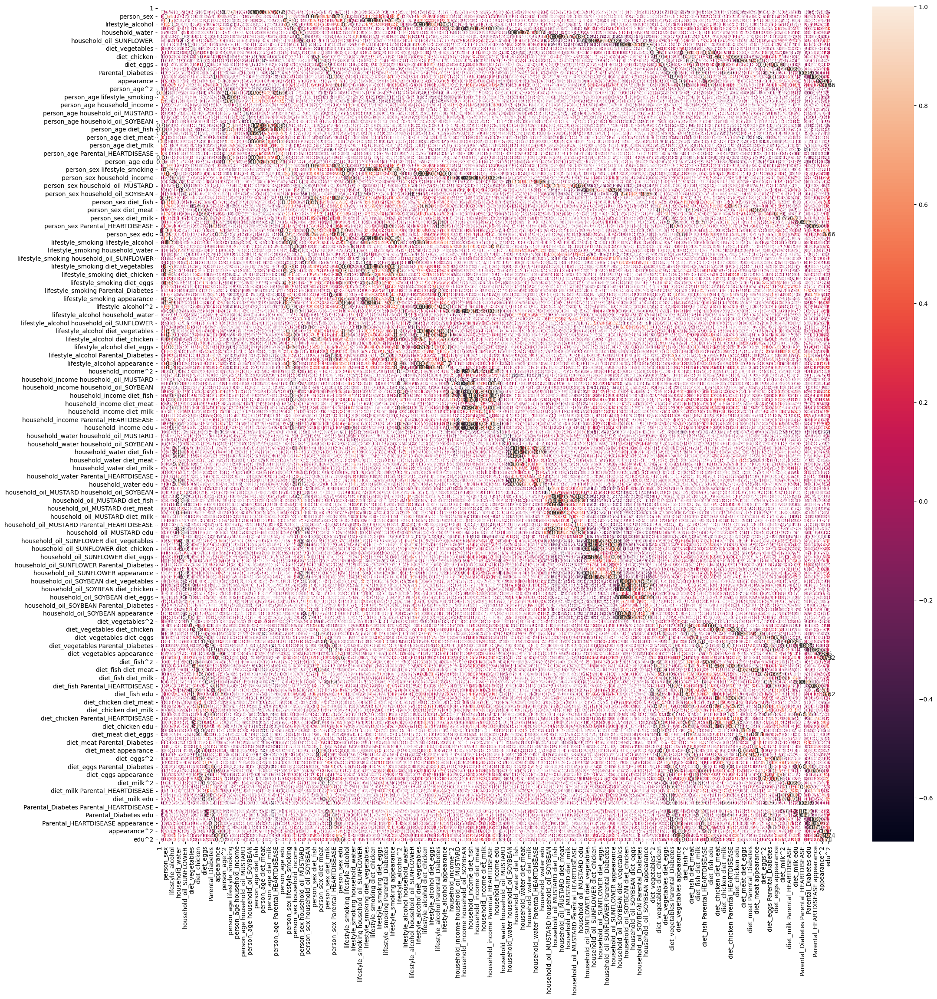

In [ ]:
corr_hmap = second_step_poly.corr()

plt.figure(figsize=(25,25))
sns.heatmap(corr_hmap, annot=True)
plt.show()

In [ ]:
import statsmodels.api as sm
#X2 = sm.add_constant(X)
est = sm.OLS(y_train,second_step_poly)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:     health_bp_systolic   R-squared:                       0.345
Model:                            OLS   Adj. R-squared:                  0.258
Method:                 Least Squares   F-statistic:                     3.963
Date:                Tue, 07 May 2024   Prob (F-statistic):           4.12e-53
Time:                        09:25:58   Log-Likelihood:                -2077.4
No. Observations:                1709   AIC:                             4557.
Df Residuals:                    1508   BIC:                             5651.
Df Model:                         200                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [ ]:
olsresult = (est2.summary2().tables[1])

In [ ]:
XPLSpoly = second_step_poly.drop(columns=['1'])

In [ ]:
from sklearn.cross_decomposition import PLSRegression
pls = PLSRegression(n_components=15)
plsfit = pls.fit(XPLSpoly, y_train)

In [ ]:
plsfit.score(XPLSpoly, y_train)

0.3290874199928566

In [ ]:
input = sm.add_constant(pls.transform(XPLSpoly))
estpls = sm.OLS(y_train, input)
estpls = estpls.fit()
print(estpls.summary())

                            OLS Regression Results                            
Dep. Variable:     health_bp_systolic   R-squared:                       0.329
Model:                            OLS   Adj. R-squared:                  0.323
Method:                 Least Squares   F-statistic:                     55.36
Date:                Tue, 07 May 2024   Prob (F-statistic):          8.17e-135
Time:                        09:26:20   Log-Likelihood:                -2097.3
No. Observations:                1709   AIC:                             4227.
Df Residuals:                    1693   BIC:                             4314.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0138      0.020      0.689      0.4

In [ ]:
plsresult=estpls.summary()
plsresult.tables

[<class 'statsmodels.iolib.table.SimpleTable'>,
 <class 'statsmodels.iolib.table.SimpleTable'>,
 <class 'statsmodels.iolib.table.SimpleTable'>]

In [ ]:
plsresult=(estpls.summary2().tables[1])

In [ ]:
plsresult

,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
const,0.013830,0.020064,0.689299,4.907294e-01,-0.025522,0.053182
x1,0.164657,0.006936,23.738535,9.124565e-108,0.151053,0.178262
x2,0.055508,0.007691,7.217090,7.983868e-13,0.040423,0.070594
x3,-0.037714,0.007004,-5.384824,8.267640e-08,-0.051451,-0.023977
x4,-0.084405,0.012476,-6.765230,1.827558e-11,-0.108876,-0.059935
x5,0.059838,0.010133,5.905322,4.244276e-09,0.039964,0.079713
x6,0.041593,0.010266,4.051590,5.317288e-05,0.021458,0.061728
x7,0.051379,0.012381,4.149841,3.492263e-05,0.027095,0.075662
x8,0.041303,0.009559,4.320685,1.645820e-05,0.022554,0.060053
x9,-0.040074,0.011258,-3.559474,3.818543e-04,-0.062155,-0.017992


In [ ]:
from google.colab import files

In [ ]:
plsresult

,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
const,-0.005718,0.024463,-0.233757,8.152134e-01,-0.053712,0.042276
x1,0.124784,0.008472,14.729423,2.940780e-45,0.108163,0.141406
x2,0.051570,0.008100,6.366241,2.753654e-10,0.035677,0.067462
x3,-0.064173,0.010477,-6.124917,1.228343e-09,-0.084729,-0.043617
x4,-0.080872,0.014040,-5.760220,1.066921e-08,-0.108417,-0.053327
x5,0.055731,0.010807,5.156872,2.935765e-07,0.034528,0.076934
x6,0.052693,0.013074,4.030289,5.922192e-05,0.027042,0.078345
x7,-0.060447,0.016011,-3.775312,1.676391e-04,-0.091859,-0.029034
x8,-0.052244,0.014458,-3.613397,3.147371e-04,-0.080610,-0.023877
x9,-0.034482,0.013277,-2.597125,9.515943e-03,-0.060531,-0.008433


In [ ]:
files=plsresult.to_csv('/content/drive/My Drive/Colab Notebooks/pls_result_2nd step_systolic.csv',index=True)

In [ ]:
files = olsresult.to_csv('/content/drive/My Drive/Colab Notebooks/ols_result_2nd step_systolic.csv',index=True)

In [ ]:
files = vif.to_csv('/content/drive/My Drive/Colab Notebooks/vif_2nd step_systolic.csv',index=True)

In [ ]:
feature_names= pls.feature_names_in_
feature_names

array(['person_age', 'person_sex', 'lifestyle_smoking',
       'lifestyle_alcohol', 'household_income', 'household_water',
       'household_oil_MUSTARD', 'household_oil_SUNFLOWER',
       'household_oil_SOYBEAN', 'diet_vegetables', 'diet_fish',
       'diet_chicken', 'diet_meat', 'diet_eggs', 'diet_milk',
       'Parental_Diabetes', 'Parental_HEARTDISEASE', 'appearance', 'edu',
       'person_age^2', 'person_age person_sex',
       'person_age lifestyle_smoking', 'person_age lifestyle_alcohol',
       'person_age household_income', 'person_age household_water',
       'person_age household_oil_MUSTARD',
       'person_age household_oil_SUNFLOWER',
       'person_age household_oil_SOYBEAN', 'person_age diet_vegetables',
       'person_age diet_fish', 'person_age diet_chicken',
       'person_age diet_meat', 'person_age diet_eggs',
       'person_age diet_milk', 'person_age Parental_Diabetes',
       'person_age Parental_HEARTDISEASE', 'person_age appearance',
       'person_age edu', '

In [ ]:
coeff = pls.coef_.flatten()
coeff

array([ 2.96398059e-01,  1.46584930e-02, -2.39558828e-02,  2.34626000e-02,
        2.22271805e-02,  5.47052867e-02,  4.80790298e-02, -2.76084989e-02,
       -2.45651357e-03,  2.49651375e-02,  1.12932669e-02,  2.91650024e-02,
       -1.77320891e-02, -7.16959766e-03, -1.19601276e-02, -9.58400890e-03,
        1.59403608e-02,  2.10661206e-01, -1.57952758e-02, -1.01824422e-03,
       -1.73151575e-01, -3.46354570e-03,  4.00873054e-02,  1.65822297e-02,
       -3.49689607e-02,  4.42320742e-02,  2.57101288e-02,  4.34490758e-02,
        1.75346957e-01,  4.35524721e-02,  3.30530941e-02,  1.66999958e-05,
        2.19381575e-02, -1.88974208e-02,  4.03688958e-03,  4.24264645e-02,
       -2.94103107e-02,  2.98938159e-02,  1.46584930e-02,  3.40159075e-02,
        8.65184768e-02, -1.14443904e-02,  6.41500491e-02, -4.32021987e-02,
       -7.30017145e-02, -1.65070762e-02, -8.52230458e-02, -7.87311677e-02,
       -7.21576161e-02, -1.13913784e-01,  3.11689872e-02,  8.15396620e-02,
        9.16622542e-03,  

In [ ]:
feature_coeff = pd.Series(coeff, index=feature_names)
feature_coeff

person_age                                       0.296398
person_sex                                       0.014658
lifestyle_smoking                               -0.023956
lifestyle_alcohol                                0.023463
household_income                                 0.022227
household_water                                  0.054705
household_oil_MUSTARD                            0.048079
household_oil_SUNFLOWER                         -0.027608
household_oil_SOYBEAN                           -0.002457
diet_vegetables                                  0.024965
diet_fish                                        0.011293
diet_chicken                                     0.029165
diet_meat                                       -0.017732
diet_eggs                                       -0.007170
diet_milk                                       -0.011960
Parental_Diabetes                               -0.009584
Parental_HEARTDISEASE                            0.015940
appearance    

In [ ]:
coef_ols = est2.params
coef_ols

1                                               -1.095179e+00
person_age                                       8.057526e-01
person_sex                                       6.261961e-02
lifestyle_smoking                               -5.260475e-01
lifestyle_alcohol                               -3.879145e-02
household_income                                 3.077744e-01
household_water                                  2.448670e-01
household_oil_MUSTARD                            2.429635e-01
household_oil_SUNFLOWER                         -3.495407e-01
household_oil_SOYBEAN                           -2.562828e-01
diet_vegetables                                  1.107474e+00
diet_fish                                        8.029441e-01
diet_chicken                                     4.998622e-01
diet_meat                                       -5.557161e-01
diet_eggs                                        9.873644e-01
diet_milk                                        1.885895e-01
Parental

In [ ]:
pvalues = est2.pvalues

In [ ]:
pvalues

1                                                0.102908
person_age                                       0.000028
person_sex                                       0.777521
lifestyle_smoking                                0.186863
lifestyle_alcohol                                0.891739
household_income                                 0.291816
household_water                                  0.219156
household_oil_MUSTARD                            0.280439
household_oil_SUNFLOWER                          0.154885
household_oil_SOYBEAN                            0.203516
diet_vegetables                                  0.369049
diet_fish                                        0.310026
diet_chicken                                     0.684987
diet_meat                                        0.826739
diet_eggs                                        0.149348
diet_milk                                        0.744061
Parental_Diabetes                                0.937102
Parental_HEART

In [ ]:
pd.options.display.max_rows = 1000
results_new = pd.DataFrame({"OLS_coeff":coef_ols, "PLS_coeff": feature_coeff, "p_values": pvalues}).drop(index=['1'])
results_new

,OLS_coeff,PLS_coeff,p_values
Parental_Diabetes,2.947474e-02,-0.009584,0.937102
Parental_Diabetes Parental_HEARTDISEASE,-8.770274e-17,0.000000,0.515987
Parental_Diabetes appearance,-1.195661e-01,-0.052851,0.416212
Parental_Diabetes edu,3.904774e-02,0.024961,0.526216
Parental_Diabetes^2,2.947474e-02,-0.009584,0.937102
Parental_HEARTDISEASE,3.121532e-01,0.015940,0.240695
Parental_HEARTDISEASE appearance,-1.431968e-02,0.004120,0.868220
Parental_HEARTDISEASE edu,2.429137e-02,0.052520,0.512628
Parental_HEARTDISEASE^2,3.121532e-01,0.015940,0.240695
appearance,5.448580e-01,0.210661,0.040622


In [ ]:
files=results_new.to_csv('/content/drive/My Drive/Colab Notebooks/CSI_result_2_systolic.csv', index=True)

**Testing the model**

In [ ]:
#Transform the data(Replaces the original values with the average values)
x_test_encoded=encoder.transform(x_test)


x_test_encoded

,Unnamed: 0,person_age,person_sex,lifestyle_smoking,lifestyle_alcohol,household_income,household_water,household_oil_MUSTARD,household_oil_SUNFLOWER,household_oil_SOYBEAN,diet_vegetables,diet_fish,diet_chicken,diet_meat,diet_eggs,diet_milk,Parental_Diabetes,Parental_HEARTDISEASE,appearance,edu
383,404,-0.630798,0,0,0,0.311366,0.024313,0.445476,1.630338,1.679755,1.000000,0.714286,0.142857,0.000000,0.571429,0.000000,0,1,3,7
1189,1234,0.974083,1,0,0,0.311366,0.024313,0.445476,1.630338,-0.595046,1.000000,0.428571,0.000000,0.000000,0.285714,0.285714,0,0,3,3
1719,1772,0.889615,1,1,0,-0.025654,0.024313,-2.243739,1.630338,-0.595046,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,1,4
1729,1782,1.227485,1,0,0,-0.025654,0.024313,0.445476,-0.613083,-0.595046,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,2,6
926,965,1.396420,0,0,0,-0.531185,0.049146,0.445476,-0.613083,-0.595046,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,1,0
1541,1589,1.311952,1,1,1,-0.194164,0.024313,0.445476,-0.613083,1.679755,1.000000,0.285714,0.142857,0.000000,0.142857,0.285714,0,0,0,4
1356,1404,-0.208461,0,0,0,-0.531185,0.024313,0.445476,-0.613083,-0.595046,1.000000,0.285714,0.000000,0.000000,0.285714,1.000000,1,0,1,2
672,708,0.805148,1,1,0,-0.531185,-0.033728,0.445476,-0.613083,-0.595046,1.000000,0.142857,0.000000,0.000000,0.000000,0.285714,0,0,1,0
1931,1994,-0.039526,1,1,1,-0.194164,0.024313,0.445476,1.630338,-0.595046,0.285714,0.714286,0.000000,0.142857,0.285714,0.000000,1,0,3,2
1419,1467,-0.208461,0,0,0,-0.362675,-0.033728,0.445476,-0.613083,-0.595046,1.000000,0.571429,0.142857,0.000000,0.285714,0.000000,0,0,1,6


In [ ]:
x_test_encoded.household_water = (x_test_encoded.household_water - x_test_encoded.household_water.mean())/(x_test_encoded.household_water.std())

In [ ]:
x_test_encoded.drop(columns='Unnamed: 0',inplace=True)

In [ ]:
trans2 = poly.fit_transform(x_test_encoded)

In [ ]:
columns = poly.get_feature_names_out(input_features=None)
columns

array(['1', 'person_age', 'person_sex', 'lifestyle_smoking',
       'lifestyle_alcohol', 'household_income', 'household_water',
       'household_oil_MUSTARD', 'household_oil_SUNFLOWER',
       'household_oil_SOYBEAN', 'diet_vegetables', 'diet_fish',
       'diet_chicken', 'diet_meat', 'diet_eggs', 'diet_milk',
       'Parental_Diabetes', 'Parental_HEARTDISEASE', 'appearance', 'edu',
       'person_age^2', 'person_age person_sex',
       'person_age lifestyle_smoking', 'person_age lifestyle_alcohol',
       'person_age household_income', 'person_age household_water',
       'person_age household_oil_MUSTARD',
       'person_age household_oil_SUNFLOWER',
       'person_age household_oil_SOYBEAN', 'person_age diet_vegetables',
       'person_age diet_fish', 'person_age diet_chicken',
       'person_age diet_meat', 'person_age diet_eggs',
       'person_age diet_milk', 'person_age Parental_Diabetes',
       'person_age Parental_HEARTDISEASE', 'person_age appearance',
       'person_age ed

In [ ]:
second_step_poly_test = pd.DataFrame(data=trans2, index=x_test_encoded.index, columns= columns)
second_step_poly_test

,1,person_age,person_sex,lifestyle_smoking,lifestyle_alcohol,household_income,household_water,household_oil_MUSTARD,household_oil_SUNFLOWER,household_oil_SOYBEAN,...,Parental_Diabetes^2,Parental_Diabetes Parental_HEARTDISEASE,Parental_Diabetes appearance,Parental_Diabetes edu,Parental_HEARTDISEASE^2,Parental_HEARTDISEASE appearance,Parental_HEARTDISEASE edu,appearance^2,appearance edu,edu^2
383,1.0,-0.630798,0.0,0.0,0.0,0.311366,0.328436,0.445476,1.630338,1.679755,...,0.0,0.0,0.0,0.0,1.0,3.0,7.0,9.0,21.0,49.0
1189,1.0,0.974083,1.0,0.0,0.0,0.311366,0.328436,0.445476,1.630338,-0.595046,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,9.0,9.0
1719,1.0,0.889615,1.0,1.0,0.0,-0.025654,0.328436,-2.243739,1.630338,-0.595046,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,16.0
1729,1.0,1.227485,1.0,0.0,0.0,-0.025654,0.328436,0.445476,-0.613083,-0.595046,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,12.0,36.0
926,1.0,1.396420,0.0,0.0,0.0,-0.531185,1.129649,0.445476,-0.613083,-0.595046,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1541,1.0,1.311952,1.0,1.0,1.0,-0.194164,0.328436,0.445476,-0.613083,1.679755,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0
1356,1.0,-0.208461,0.0,0.0,0.0,-0.531185,0.328436,0.445476,-0.613083,-0.595046,...,1.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.0,4.0
672,1.0,0.805148,1.0,1.0,0.0,-0.531185,-1.544124,0.445476,-0.613083,-0.595046,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1931,1.0,-0.039526,1.0,1.0,1.0,-0.194164,0.328436,0.445476,1.630338,-0.595046,...,1.0,0.0,3.0,2.0,0.0,0.0,0.0,9.0,6.0,4.0
1419,1.0,-0.208461,0.0,0.0,0.0,-0.362675,-1.544124,0.445476,-0.613083,-0.595046,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,6.0,36.0


In [ ]:
second_step_poly_test.drop(columns=['household_oil_MUSTARD^2','household_oil_SUNFLOWER^2','household_oil_SOYBEAN^2'],inplace=True)

In [ ]:
XPLSpoly_test = second_step_poly_test.drop(columns=['1'])

In [ ]:
y_predict = pd.Series(plsfit.predict(XPLSpoly_test).reshape(1, -1)[0], index=y_test.index)

In [ ]:
r_square = plsfit.score(XPLSpoly_test,y_test)
r_square

0.15696130603416814

In [ ]:
mse = mean_squared_error(y_test, y_predict)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.7845938454375704


In [ ]:
from sklearn.linear_model import ElasticNet
elastic_net = ElasticNet(alpha=0.01, l1_ratio=0.02).fit(XPLSpoly, y_train)
print(f"Elastic Net-Training set score: {elastic_net.score(XPLSpoly, y_train):.2f}")
print(f"Elastic Net-Test set score: {elastic_net.score(XPLSpoly_test, y_test):.2f}")

Elastic Net-Training set score: 0.32
Elastic Net-Test set score: 0.21
